### **1. Download the dataset and import the libraries**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install kaggle

In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp /content/drive/MyDrive/kaggle_api/kaggle.json ~/.kaggle/kaggle.json

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d payne18/road-detection-dataset-with-masks

road-detection-dataset-with-masks.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
! unzip road-detection-dataset-with-masks.zip;

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: deepglobe-road-extraction-dataset/train/737263_sat.jpg  
  inflating: deepglobe-road-extraction-dataset/train/7372_mask.png  
  inflating: deepglobe-road-extraction-dataset/train/7372_sat.jpg  
  inflating: deepglobe-road-extraction-dataset/train/737508_mask.png  
  inflating: deepglobe-road-extraction-dataset/train/737508_sat.jpg  
  inflating: deepglobe-road-extraction-dataset/train/737584_mask.png  
  inflating: deepglobe-road-extraction-dataset/train/737584_sat.jpg  
  inflating: deepglobe-road-extraction-dataset/train/737666_mask.png  
  inflating: deepglobe-road-extraction-dataset/train/737666_sat.jpg  
  inflating: deepglobe-road-extraction-dataset/train/738170_mask.png  
  inflating: deepglobe-road-extraction-dataset/train/738170_sat.jpg  
  inflating: deepglobe-road-extraction-dataset/train/738407_mask.png  
  inflating: deepglobe-road-extraction-dataset/train/738407_sat.jpg  
  inflating: deepglobe-road-ext

In [ ]:
import pandas as pd
import os
import cv2
import numpy as np
import glob

import numpy as np
from matplotlib import pyplot as plt
import tifffile as tiff
from PIL import Image
import tensorflow as tf
from tensorflow import keras
! pip install segmentation_models
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm
from tensorflow.keras.metrics import MeanIoU
import random
!pip install split-folders
import splitfolders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.0 MB/s eta 0:00:00
Segmentation Models: using `tf.keras` framework.


### **2. Working with the meta data and splitting the folders for training and validating**

In [ ]:
df = pd.read_csv('/content/deepglobe-road-extraction-dataset/metadata.csv')
df.head()

,image_id,split,sat_image_path,mask_path
0,100034,train,train/100034_sat.jpg,train/100034_mask.png
1,100081,train,train/100081_sat.jpg,train/100081_mask.png
2,100129,train,train/100129_sat.jpg,train/100129_mask.png
3,100703,train,train/100703_sat.jpg,train/100703_mask.png
4,100712,train,train/100712_sat.jpg,train/100712_mask.png


In [ ]:
train_data = df[df['split'] == 'train']
test_data = df[df['split'] == 'test']

train_data['full_img_path'] = '/content/deepglobe-road-extraction-dataset/' + train_data['sat_image_path']
train_data['full_mask_path'] = '/content/deepglobe-road-extraction-dataset/' + train_data['mask_path']


test_data['full_img_path'] = '/content/deepglobe-road-extraction-dataset/' + test_data['sat_image_path']

# empty mask file
test_data['full_mask_path'] = '/content/deepglobe-road-extraction-dataset/train/00001_mask.png'

train_data.head()
test_data.head()

<ipython-input-24-79a78209f7b8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['full_img_path'] = '/content/deepglobe-road-extraction-dataset/' + train_data['sat_image_path']
<ipython-input-24-79a78209f7b8>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['full_mask_path'] = '/content/deepglobe-road-extraction-dataset/' + train_data['mask_path']
<ipython-input-24-79a78209f7b8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

,image_id,split,sat_image_path,mask_path,full_img_path,full_mask_path
7469,100393,test,test/100393_sat.jpg,NaN,/content/deepglobe-road-extraction-dataset/tes...,/content/deepglobe-road-extraction-dataset/tra...
7470,100995,test,test/100995_sat.jpg,NaN,/content/deepglobe-road-extraction-dataset/tes...,/content/deepglobe-road-extraction-dataset/tra...
7471,101982,test,test/101982_sat.jpg,NaN,/content/deepglobe-road-extraction-dataset/tes...,/content/deepglobe-road-extraction-dataset/tra...
7472,10206,test,test/10206_sat.jpg,NaN,/content/deepglobe-road-extraction-dataset/tes...,/content/deepglobe-road-extraction-dataset/tra...
7473,102240,test,test/102240_sat.jpg,NaN,/content/deepglobe-road-extraction-dataset/tes...,/content/deepglobe-road-extraction-dataset/tra...


In [ ]:
img_list = train_data['full_img_path']
msk_list = train_data['full_mask_path']

In [ ]:
num_images = len(img_list)

Checking the images match the masks or not

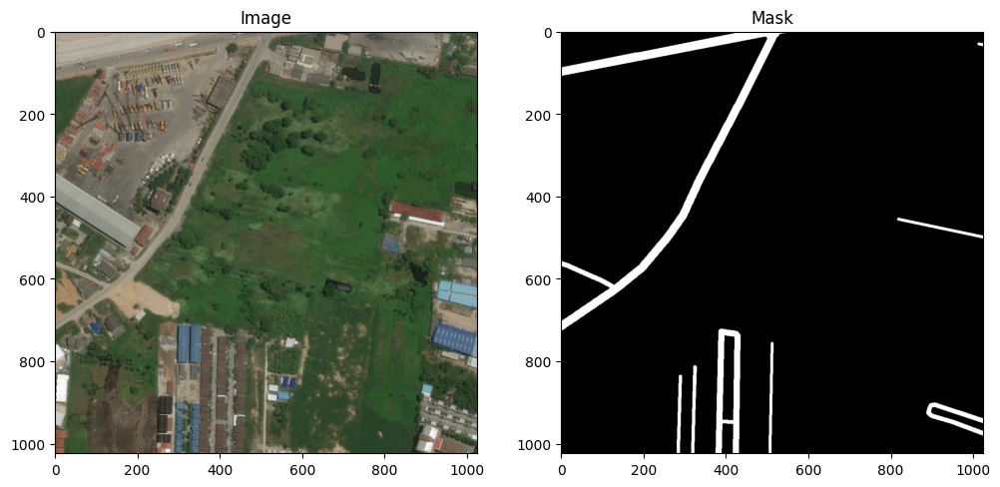

In [ ]:
# Get a random number and then show the image at that position in the paths columns
img_num = random.randint(0, num_images-1)

img_for_plot = cv2.imread(img_list[img_num], 1)
img_for_plot = cv2.cvtColor(img_for_plot, cv2.COLOR_BGR2RGB)

mask_for_plot =cv2.imread(msk_list[img_num], 0)

plt.figure(figsize=(12, 8))
plt.subplot(121)
plt.imshow(img_for_plot)
plt.title('Image')
plt.subplot(122)
plt.imshow(mask_for_plot, cmap='gray')
plt.title('Mask')
plt.show()


In [ ]:
img_list

0       /content/deepglobe-road-extraction-dataset/tra...
1       /content/deepglobe-road-extraction-dataset/tra...
2       /content/deepglobe-road-extraction-dataset/tra...
3       /content/deepglobe-road-extraction-dataset/tra...
4       /content/deepglobe-road-extraction-dataset/tra...
                              ...                        
6221    /content/deepglobe-road-extraction-dataset/tra...
6222    /content/deepglobe-road-extraction-dataset/tra...
6223    /content/deepglobe-road-extraction-dataset/tra...
6224    /content/deepglobe-road-extraction-dataset/tra...
6225    /content/deepglobe-road-extraction-dataset/tra...
Name: full_img_path, Length: 6226, dtype: object

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

data_dir = '/content/deepglobe-road-extraction-dataset/train'

# Make new data directory if not existed
os.makedirs(data_dir, exist_ok=True)

# Specify the paths for the train and validation folders
train_images_folder = os.path.join(data_dir, 'train_images', 'train')
train_masks_folder = os.path.join(data_dir, 'train_masks', 'train')
val_images_folder = os.path.join(data_dir, 'val_images', 'val')
val_masks_folder = os.path.join(data_dir, 'val_masks', 'val')

# Make train and valid folder if not existed
os.makedirs(train_images_folder, exist_ok=True)
os.makedirs(train_masks_folder, exist_ok=True)
os.makedirs(val_images_folder, exist_ok=True)
os.makedirs(val_masks_folder, exist_ok=True)

# Split the data into train and validation sets
img_train, img_val, msk_train, msk_val = train_test_split(img_list, msk_list, test_size=0.2, random_state=42)

# Function to move files
def move_files(src_img_paths, src_msk_paths, dest_img_folder, dest_msk_folder):
    for src_img, src_msk in zip(src_img_paths, src_msk_paths):
        img_name = os.path.basename(src_img)
        msk_name = os.path.basename(src_msk)

        dest_img_path = os.path.join(dest_img_folder, img_name)
        dest_msk_path = os.path.join(dest_msk_folder, msk_name)

        shutil.move(src_img, dest_img_path)
        shutil.move(src_msk, dest_msk_path)

# Call the function
move_files(img_train, msk_train, train_images_folder, train_masks_folder)

move_files(img_val, msk_val, val_images_folder, val_masks_folder)



In [ ]:
'''import os
import numpy as np
from PIL import Image

# Function to crop and save images and masks
def crop_and_save(src_folder, dest_folder):
    # Get the list of files in the source folder
    file_list = os.listdir(src_folder)

    for file_name in file_list:
        # Construct the full path of the file
        file_path = os.path.join(src_folder, file_name)

        # Open the image using PIL
        img = Image.open(file_path)

        # Convert the image to a NumPy array
        img_array = np.array(img)

        # Get the dimensions of the original image
        width, height = img.size

        # Define the size of the patches
        patch_size = (256, 256)

        # Iterate over the image and crop into patches
        for i in range(0, width, patch_size[0]):
            for j in range(0, height, patch_size[1]):
                # Define the region to crop
                box = (i, j, i + patch_size[0], j + patch_size[1])

                # Crop the image using array slicing
                cropped_img_array = img_array[box[1]:box[3], box[0]:box[2], :]

                # Convert the NumPy array back to PIL Image
                cropped_img = Image.fromarray(cropped_img_array)

                # Construct the destination path for the cropped image
                dest_path = os.path.join(dest_folder, f"{os.path.splitext(file_name)[0]}_{i}_{j}.png")

                # Save the cropped image
                cropped_img.save(dest_path)

        # Remove the original big image
        os.remove(file_path)

# Crop and save training images and masks
crop_and_save(train_images_folder, train_images_folder)
crop_and_save(train_masks_folder, train_masks_folder)

# Crop and save validation images and masks
crop_and_save(val_images_folder, val_images_folder)
crop_and_save(val_masks_folder, val_masks_folder)
'''

### **3. Data Preprocessing and Train set and Valid set Loader**

In [ ]:
seed=24
batch_size= 16
n_classes=2

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
from keras.utils import to_categorical

#Preprocess input for transfer learning
BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

In [ ]:
def preprocess_data(img, mask, num_class):
    # Scale images
    scaler = MinMaxScaler()
    img_flat = img.reshape(-1, img.shape[-1])
    img_scaled = scaler.fit_transform(img_flat).reshape(img.shape)
    img_processed = preprocess_input(img_scaled)  # Preprocess based on the pretrained backbone...

    # Ensure mask values are within the range [0, num_classes-1]
    mask = np.clip(mask, 0, num_class - 1)

    # Convert mask to one-hot
    mask_one_hot = to_categorical(mask, num_class)

    return img_processed, mask_one_hot

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
def trainGenerator(train_img_path, train_mask_path, num_class):

    img_data_gen_args = dict(horizontal_flip=True,
                      vertical_flip=True,
                      fill_mode='reflect')

    image_datagen = ImageDataGenerator(**img_data_gen_args)
    mask_datagen = ImageDataGenerator(**img_data_gen_args)

    image_generator = image_datagen.flow_from_directory(
        train_img_path,
        class_mode = None,
        batch_size = batch_size,
        seed = seed)

    mask_generator = mask_datagen.flow_from_directory(
        train_mask_path,
        class_mode = None,
        color_mode = 'grayscale',
        batch_size = batch_size,
        seed = seed)

    train_generator = zip(image_generator, mask_generator)

    for (img, mask) in train_generator:
        img, mask = preprocess_data(img, mask, num_class)
        yield (img, mask)



In [ ]:
train_img_path = "/content/deepglobe-road-extraction-dataset/train/train_images/"
train_mask_path = "/content/deepglobe-road-extraction-dataset/train/train_masks/"


val_img_path = "/content/deepglobe-road-extraction-dataset/train/val_images/"
val_mask_path = "/content/deepglobe-road-extraction-dataset/train/val_masks/"


In [ ]:
# Create generators
train_img_gen = trainGenerator(train_img_path, train_mask_path, num_class=n_classes)
val_img_gen = trainGenerator(val_img_path, val_mask_path, num_class=n_classes)

x, y = train_img_gen.__next__()


Found 4980 images belonging to 1 classes.
Found 4980 images belonging to 1 classes.


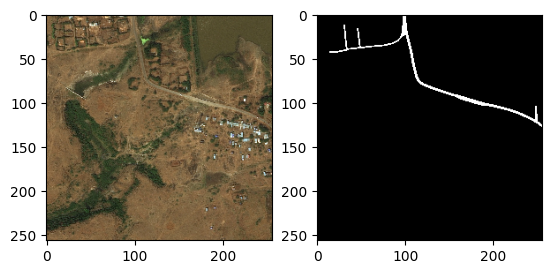

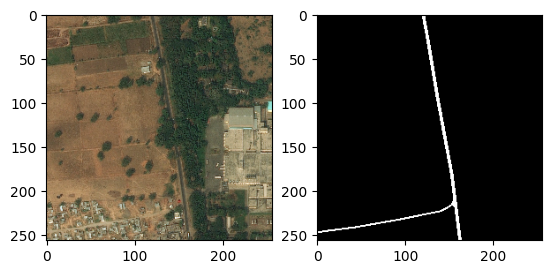

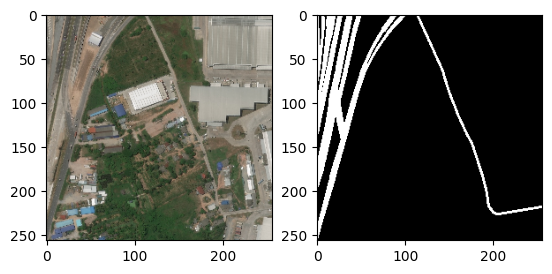

Found 1246 images belonging to 1 classes.
Found 1246 images belonging to 1 classes.


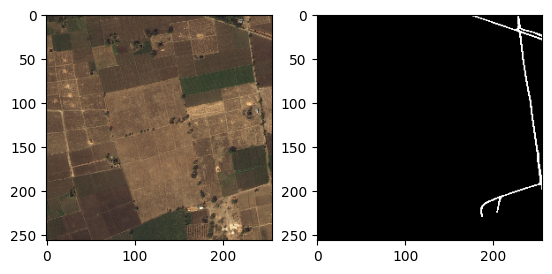

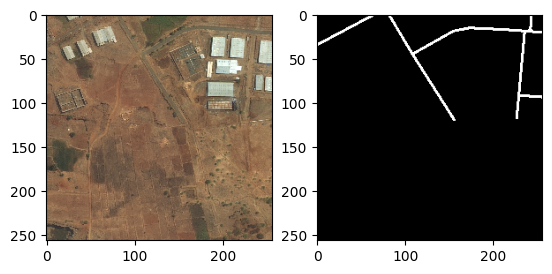

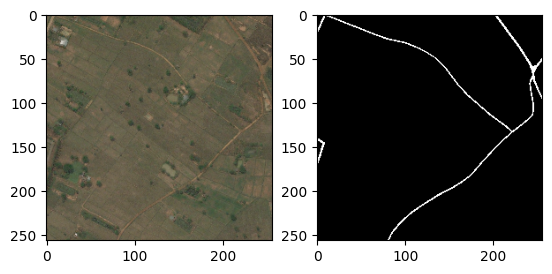

In [ ]:
for i in range(0,3):
    image = x[i]
    mask = np.argmax(y[i], axis=2)

    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.imshow(mask, cmap='gray')
    plt.show()

x_val, y_val = val_img_gen.__next__()

for i in range(0,3):
    image = x_val[i]
    mask = np.argmax(y_val[i], axis=2)
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.imshow(mask, cmap='gray')
    plt.show()

In [ ]:
num_train_imgs = len(os.listdir('/content/deepglobe-road-extraction-dataset/train/train_images/train/'))
num_val_images = len(os.listdir('/content/deepglobe-road-extraction-dataset/train/val_images/val/'))
steps_per_epoch = num_train_imgs//batch_size
val_steps_per_epoch = num_val_images//batch_size


IMG_HEIGHT = x.shape[1]
IMG_WIDTH  = x.shape[2]
IMG_CHANNELS = x.shape[3]

n_classes=2

In [ ]:
model = sm.Unet(BACKBONE, encoder_weights='imagenet',
                input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
                classes=n_classes, activation='softmax')
model.compile('Adam', loss=sm.losses.categorical_focal_jaccard_loss, metrics=[sm.metrics.iou_score])

85521592/85521592 [==============================] - 0s 0us/step


In [ ]:
print(model.summary())
print(model.input_shape)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 256, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 262, 262, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                            

In [ ]:
from keras.models import load_model
model_2 = load_model('/content/drive/MyDrive/road_lane_segmentation_batch16.hdf5', custom_objects= {'focal_loss_plus_jaccard_loss': sm.losses.categorical_focal_jaccard_loss, 'iou_score': sm.metrics.iou_score })
history=model_2.fit(train_img_gen,
          steps_per_epoch=steps_per_epoch,
          epochs=25,
          verbose=1,
          validation_data=val_img_gen,
          validation_steps=val_steps_per_epoch)


Epoch 1/25
311/311 [==============================] - 244s 725ms/step - loss: 0.2535 - iou_score: 0.7598 - val_loss: 0.2832 - val_iou_score: 0.7342
Epoch 2/25
311/311 [==============================] - 224s 720ms/step - loss: 0.2538 - iou_score: 0.7598 - val_loss: 0.2854 - val_iou_score: 0.7324
Epoch 3/25
311/311 [==============================] - 222s 716ms/step - loss: 0.2535 - iou_score: 0.7604 - val_loss: 0.2904 - val_iou_score: 0.7267
Epoch 4/25
311/311 [==============================] - 222s 714ms/step - loss: 0.2529 - iou_score: 0.7605 - val_loss: 0.2815 - val_iou_score: 0.7363
Epoch 5/25
311/311 [==============================] - 221s 711ms/step - loss: 0.2502 - iou_score: 0.7634 - val_loss: 0.2839 - val_iou_score: 0.7349
Epoch 6/25
311/311 [==============================] - 261s 843ms/step - loss: 0.2497 - iou_score: 0.7638 - val_loss: 0.2884 - val_iou_score: 0.7303
Epoch 7/25
311/311 [==============================] - 222s 714ms/step - loss: 0.2464 - iou_score: 0.7669 - val_l

In [ ]:
model.save('/content/drive/MyDrive/road_lane_segmentation_batch16_2.hdf5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


First 25 epochs

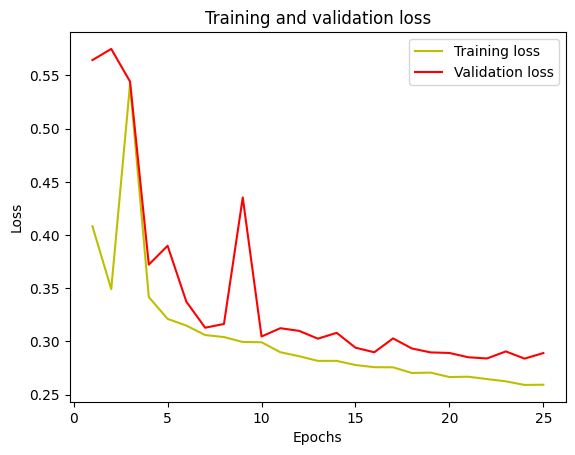

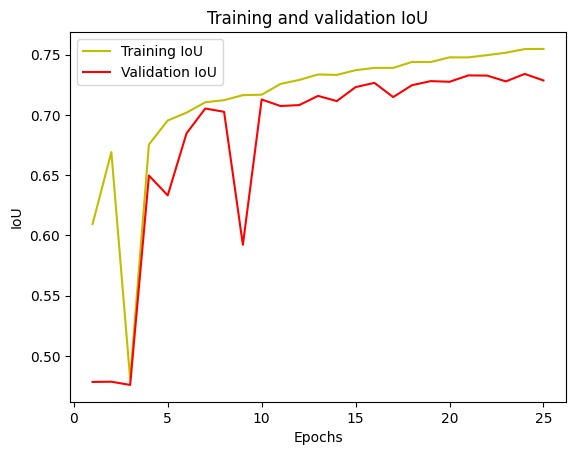

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['iou_score']
val_acc = history.history['val_iou_score']

plt.plot(epochs, acc, 'y', label='Training IoU')
plt.plot(epochs, val_acc, 'r', label='Validation IoU')
plt.title('Training and validation IoU')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.show()

Next 25 epochs

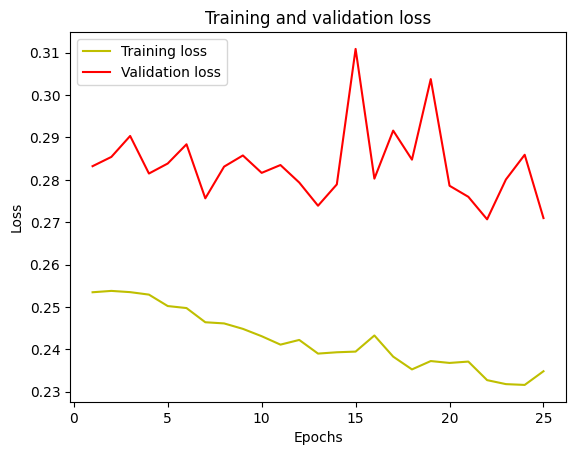

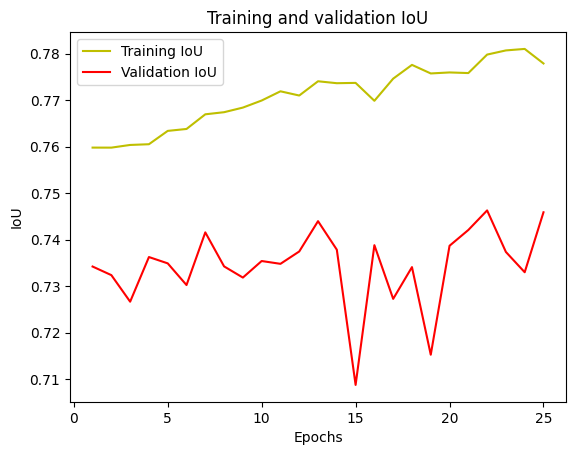

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['iou_score']
val_acc = history.history['val_iou_score']

plt.plot(epochs, acc, 'y', label='Training IoU')
plt.plot(epochs, val_acc, 'r', label='Validation IoU')
plt.title('Training and validation IoU')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.show()

In [ ]:
from keras.models import load_model

model = load_model("/content/drive/MyDrive/road_lane_segmentation_batch16.hdf5", compile=False)

#batch_size=32 #Check IoU for a batch of images

#Test generator using validation data.

test_image_batch, test_mask_batch = val_img_gen.__next__()

#Convert categorical to integer for visualization and IoU calculation
test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

1/1 [==============================] - 7s 7s/step
Mean IoU = 0.78790903


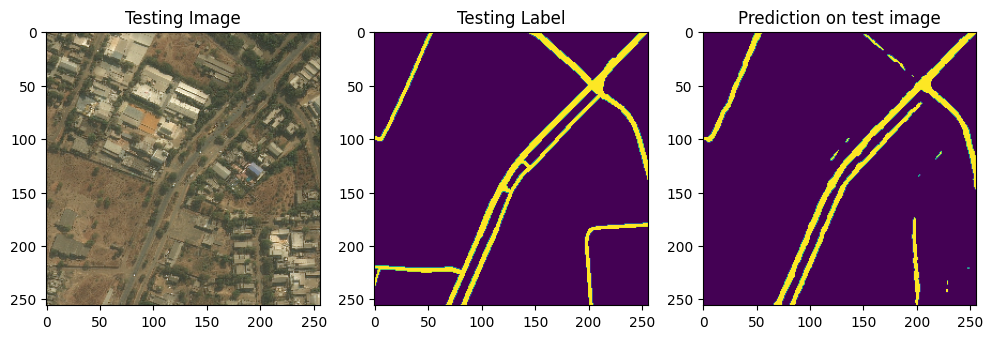

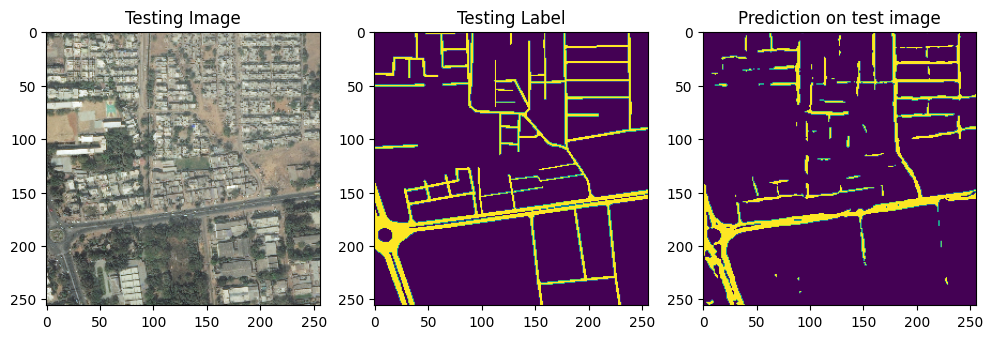

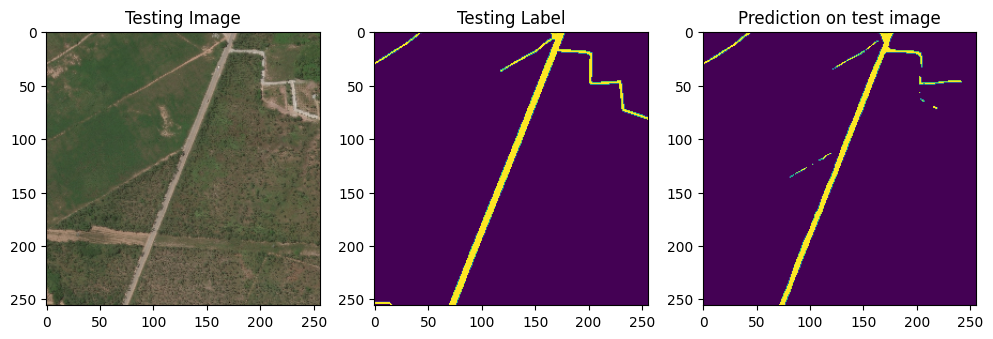

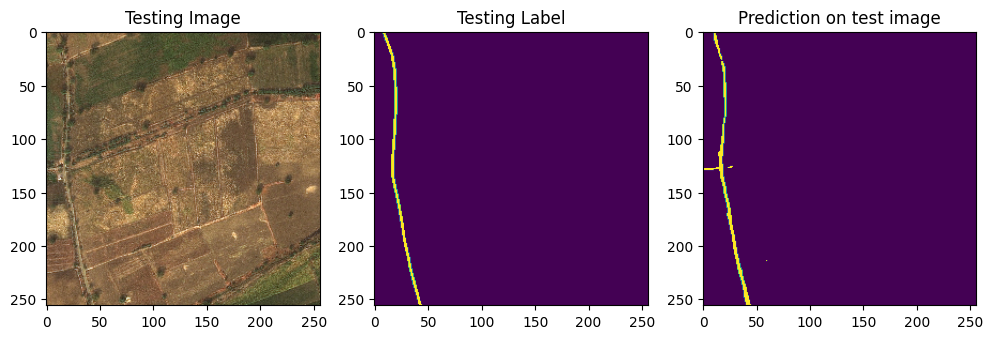

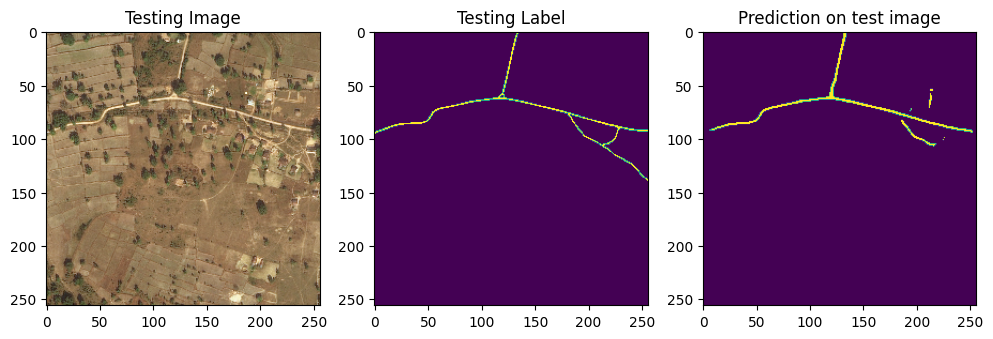

...

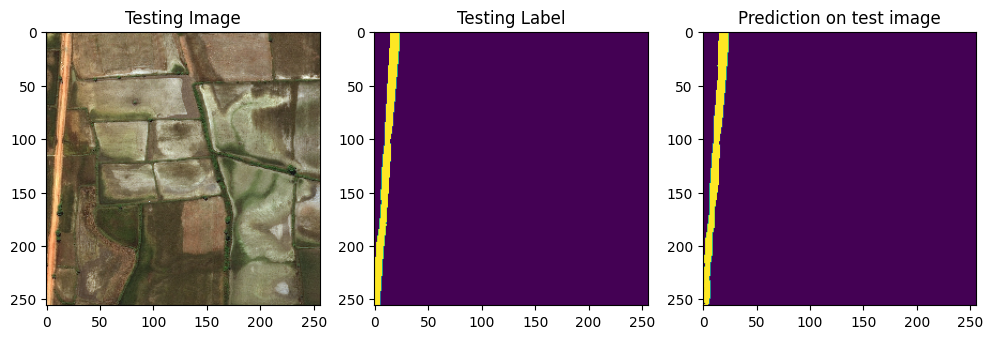

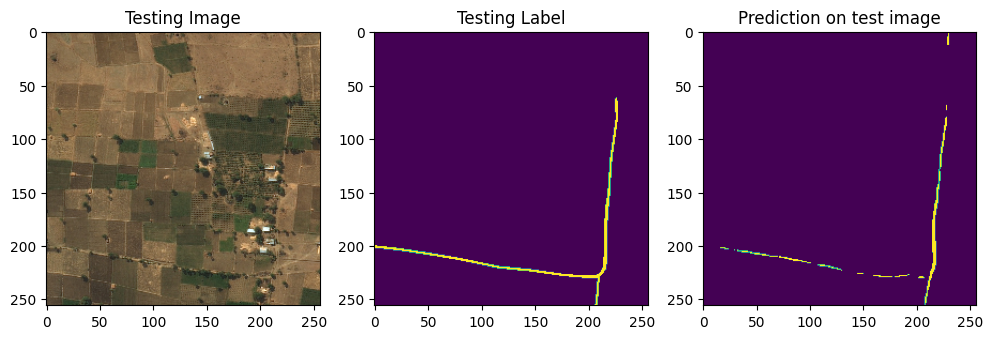

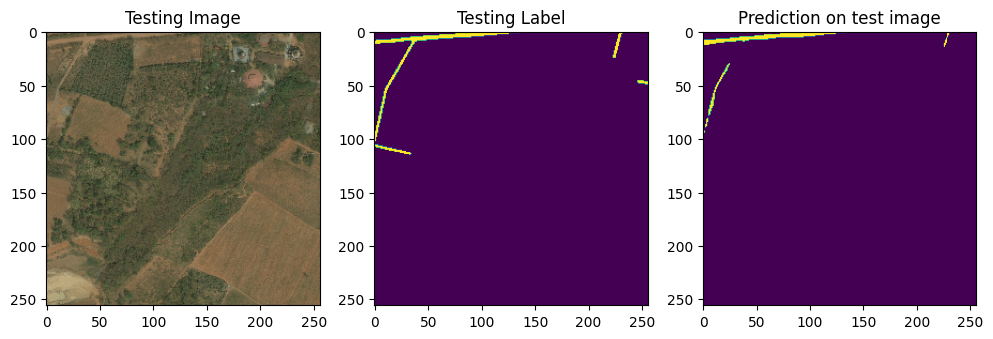

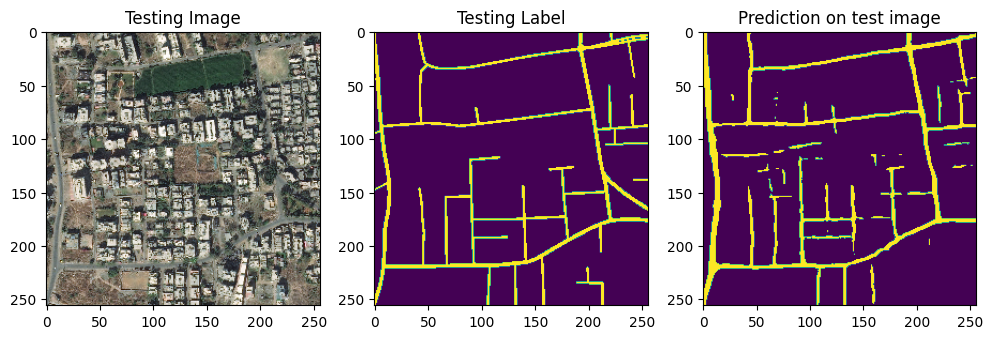

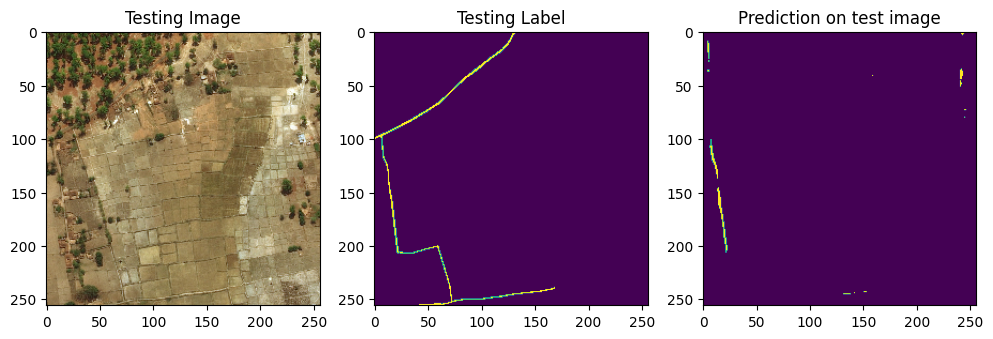

In [ ]:
for img_num in range(0, test_image_batch.shape[0]-1):

  plt.figure(figsize=(12, 8))
  plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(test_image_batch[img_num])
  plt.subplot(232)
  plt.title('Testing Label')
  plt.imshow(test_mask_batch_argmax[img_num])
  plt.subplot(233)
  plt.title('Prediction on test image')
  plt.imshow(test_pred_batch_argmax[img_num])
  plt.show()

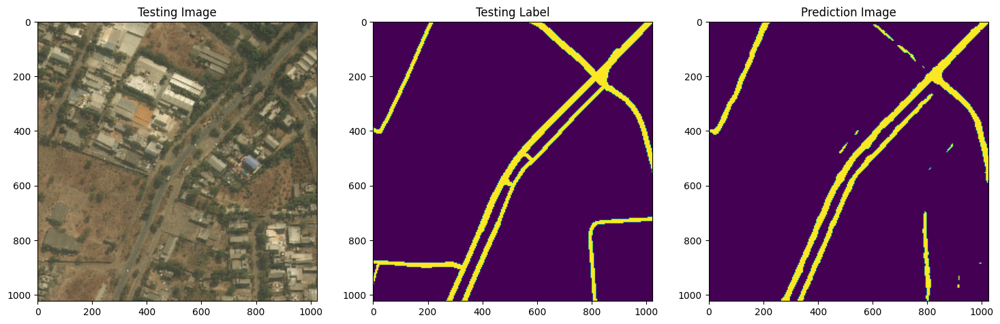

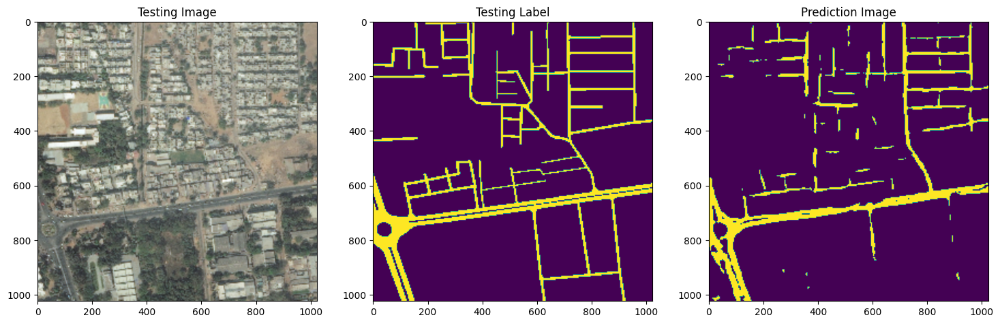

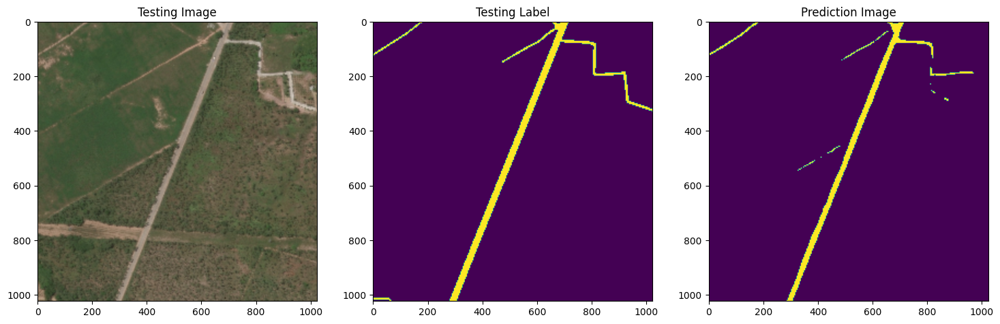

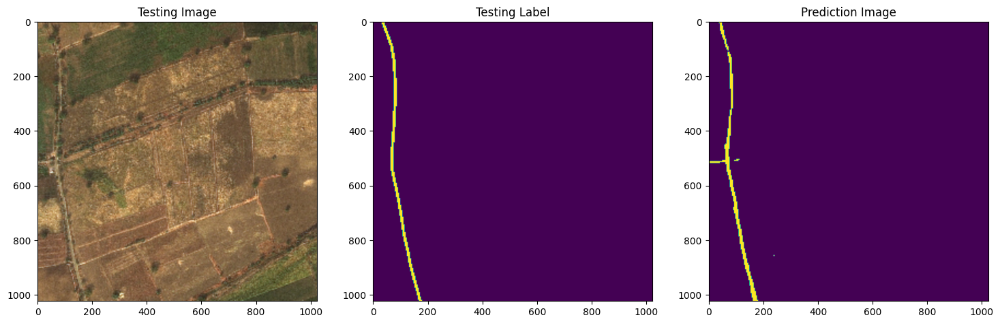

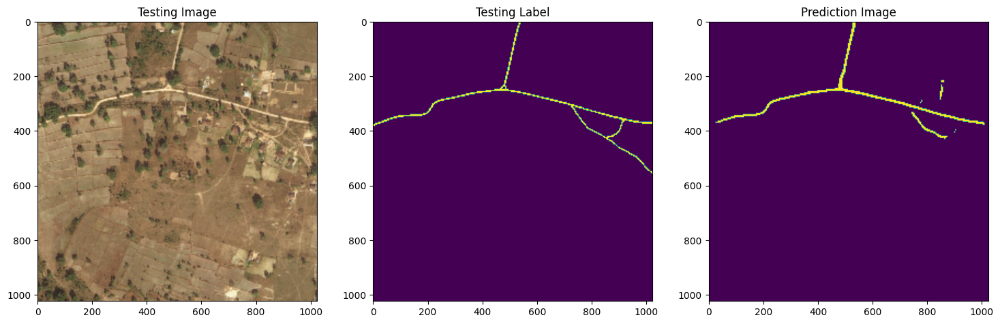

...

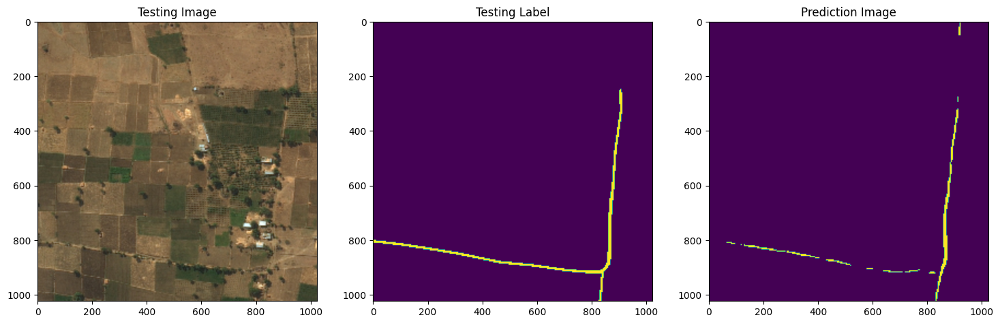

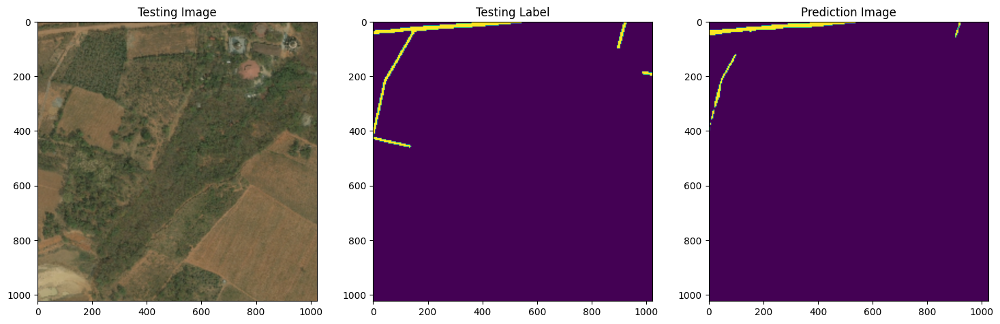

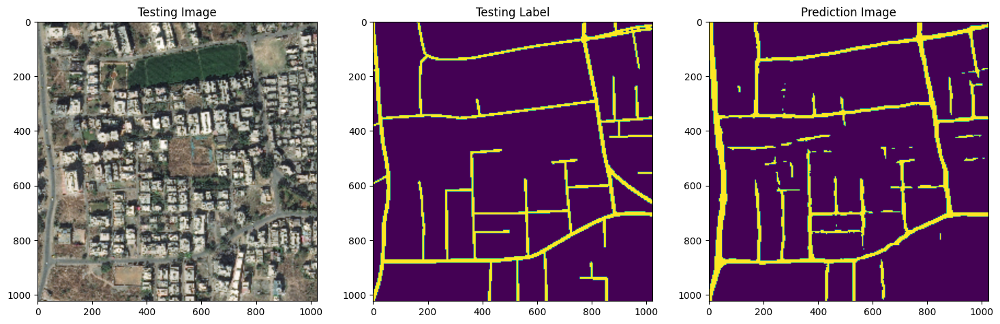

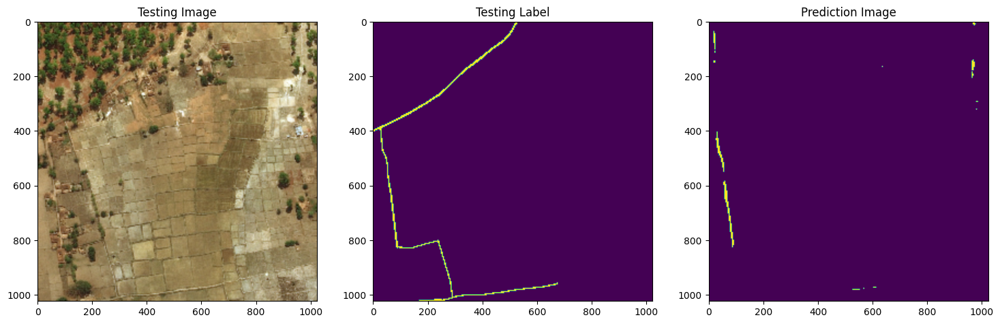

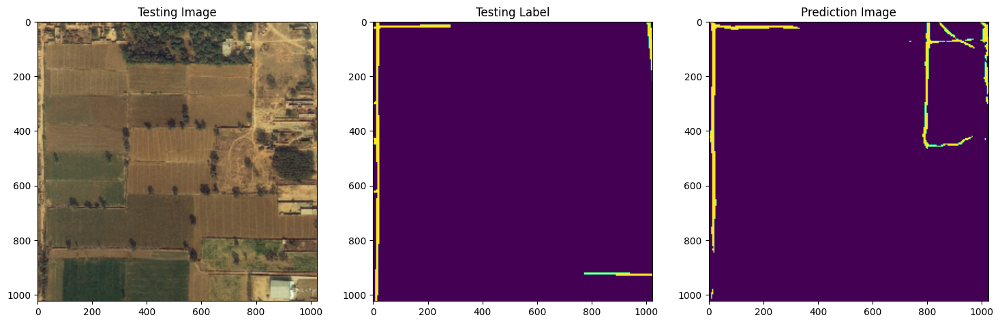

In [ ]:
import matplotlib.pyplot as plt
import cv2

target_shape = (1024, 1024)

for img_num in range(test_image_batch.shape[0]):
    resized_test_image = cv2.resize(test_image_batch[img_num], target_shape[::-1])

    resized_test_label = cv2.resize(test_mask_batch_argmax[img_num].astype(float), target_shape[::-1], interpolation=cv2.INTER_NEAREST)

    resized_test_pred = cv2.resize(test_pred_batch_argmax[img_num].astype(float), target_shape[::-1], interpolation=cv2.INTER_NEAREST)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].set_title('Testing Image')
    axs[0].imshow(resized_test_image)

    axs[1].set_title('Testing Label')
    axs[1].imshow(resized_test_label)

    axs[2].set_title('Prediction Image')
    axs[2].imshow(resized_test_pred)

    plt.show()


In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 256, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 262, 262, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                            

In [ ]:
y.shape

(16, 256, 256, 2)

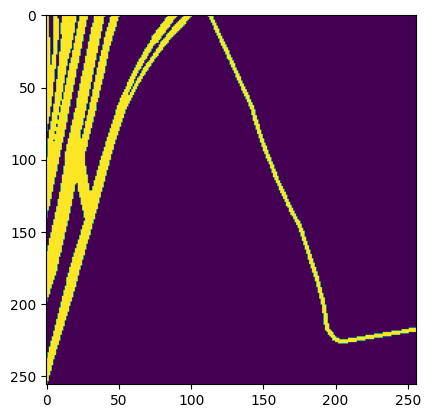

In [ ]:
plt.imshow(y[2,:,:,1])

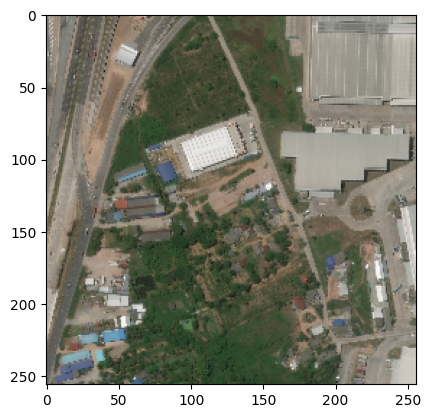

In [ ]:
plt.imshow(x[2,:,:,:])

In [ ]:
def count_layers(model):
   num_layers = len(model.layers)
   for layer in model.layers:
      if isinstance(layer, tf.keras.Model):
         num_layers += count_layers(layer)
   return num_layers

In [ ]:
a = count_layers(model)
print(a)

199


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 10.1 MB/s eta 0:00:00


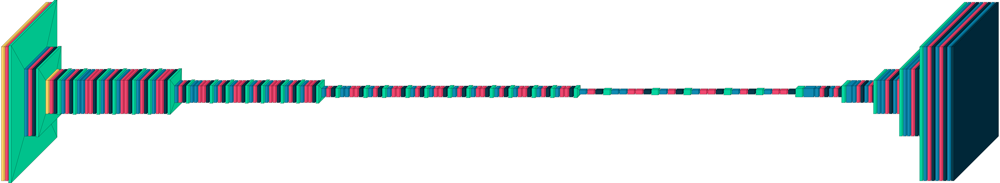

In [ ]:
! pip install visualkeras
import visualkeras
visualkeras.layered_view(model)